# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [135]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5.

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


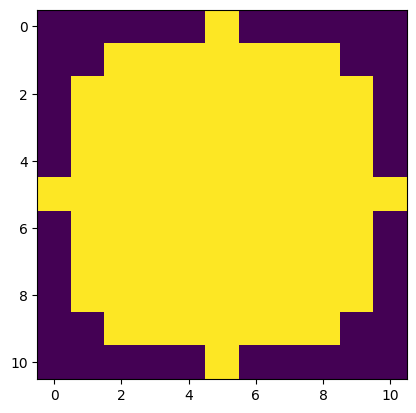

In [136]:
if student :
  strell = morpho.disk(5)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[1]
 [1]
 [1]
 [1]
 [1]]


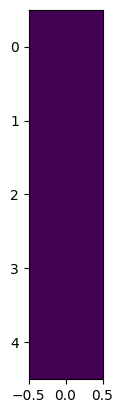

In [137]:
def line_strell(length):
  if student :
    strell = morpho.rectangle(length, 1)
  return strell

strell = line_strell(5)
print(strell)
plt.imshow(strell)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

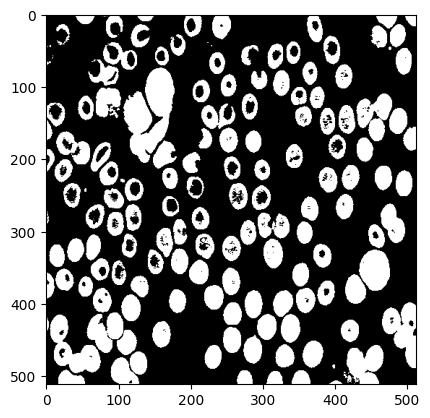

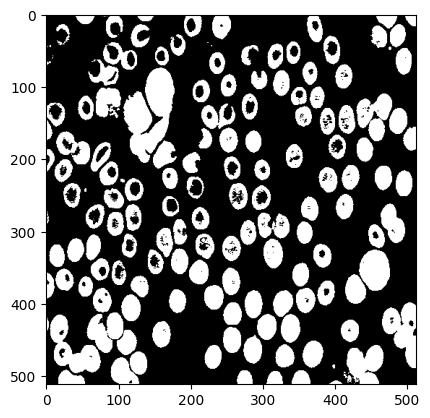

In [138]:
#load the cell image in grayscale and display it
if student:
  img = skio.imread("cell.tif")
  img = img < 150
  plt.imshow(img, cmap='gray')
  plt.show()
  plt.imshow(img, cmap='gray')

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

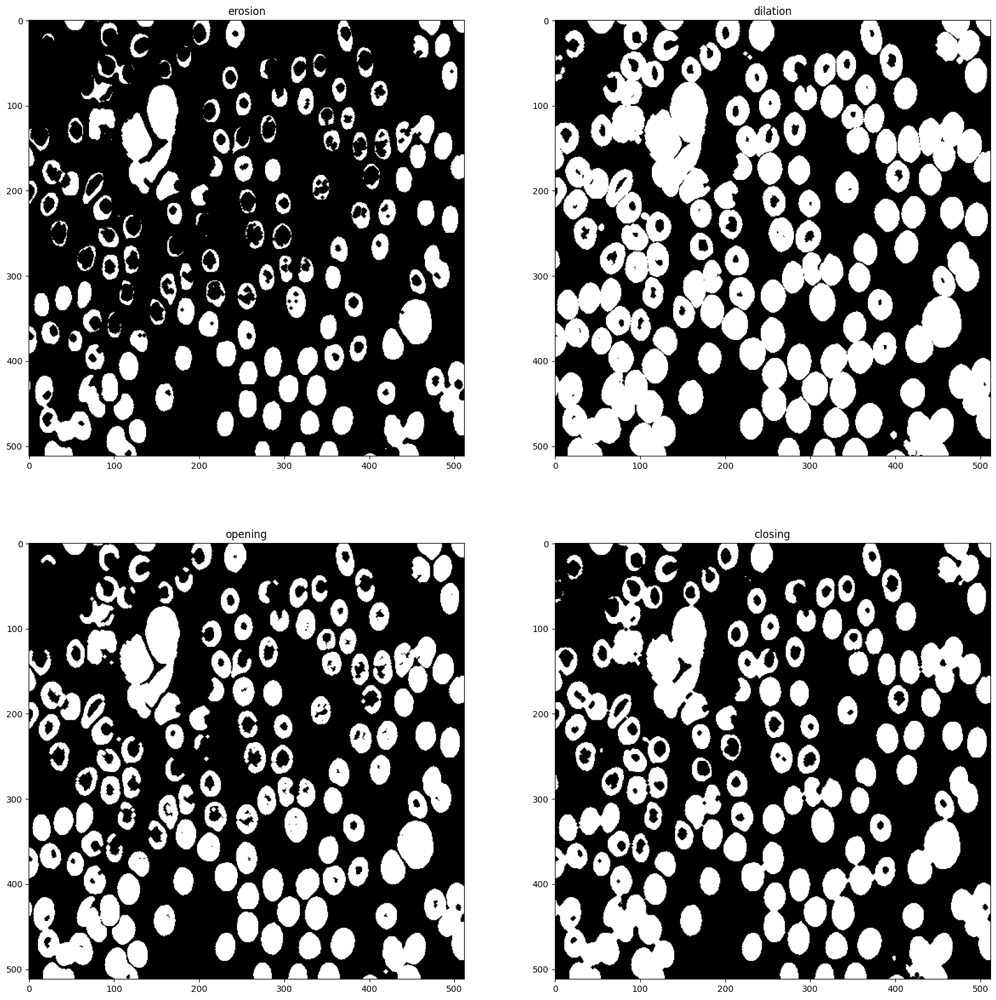

In [139]:
strell = morpho.disk(2)
def plot(strell):
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.erosion(img, strell),morpho.dilation(img, strell),morpho.opening(img, strell),morpho.closing(img, strell)]# 4 images, obtained with the four operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

plot(strell)

> 4 operations for a structurant element that is a disk with radius 2.



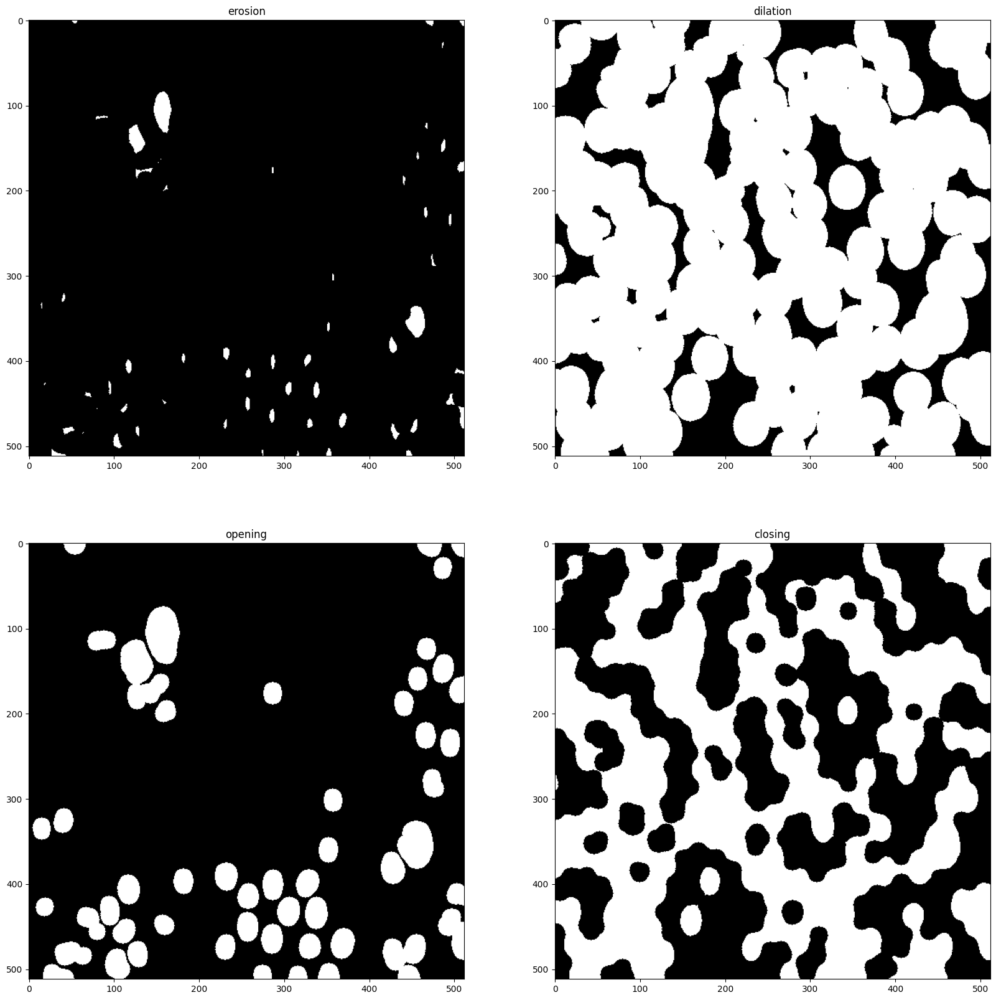

In [140]:
if student :
  strell = morpho.disk(10)
  plot(strell)

>4 operations for a structurant element that is a disk with radius 10.

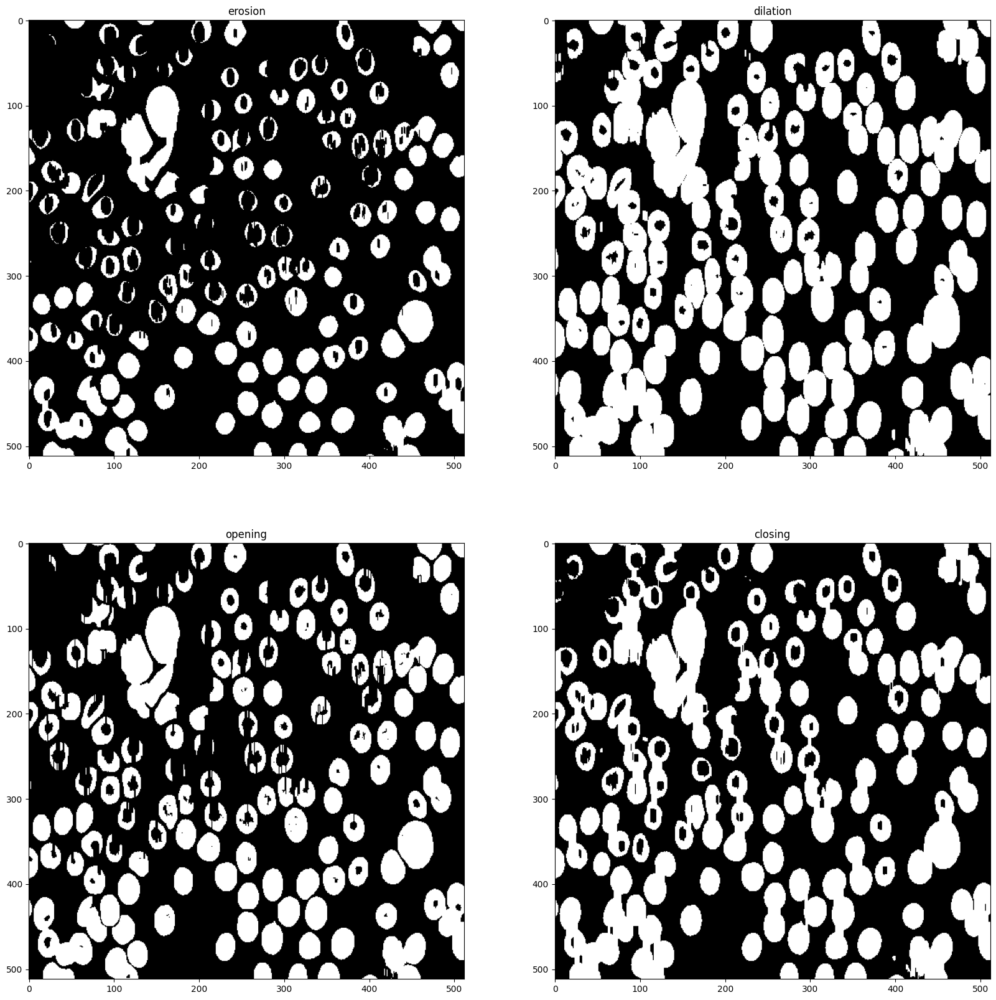

In [141]:
if student :
  strell = line_strell(8)
  plot(strell)

> 4 operations for a structurant element that is a line with length 8.

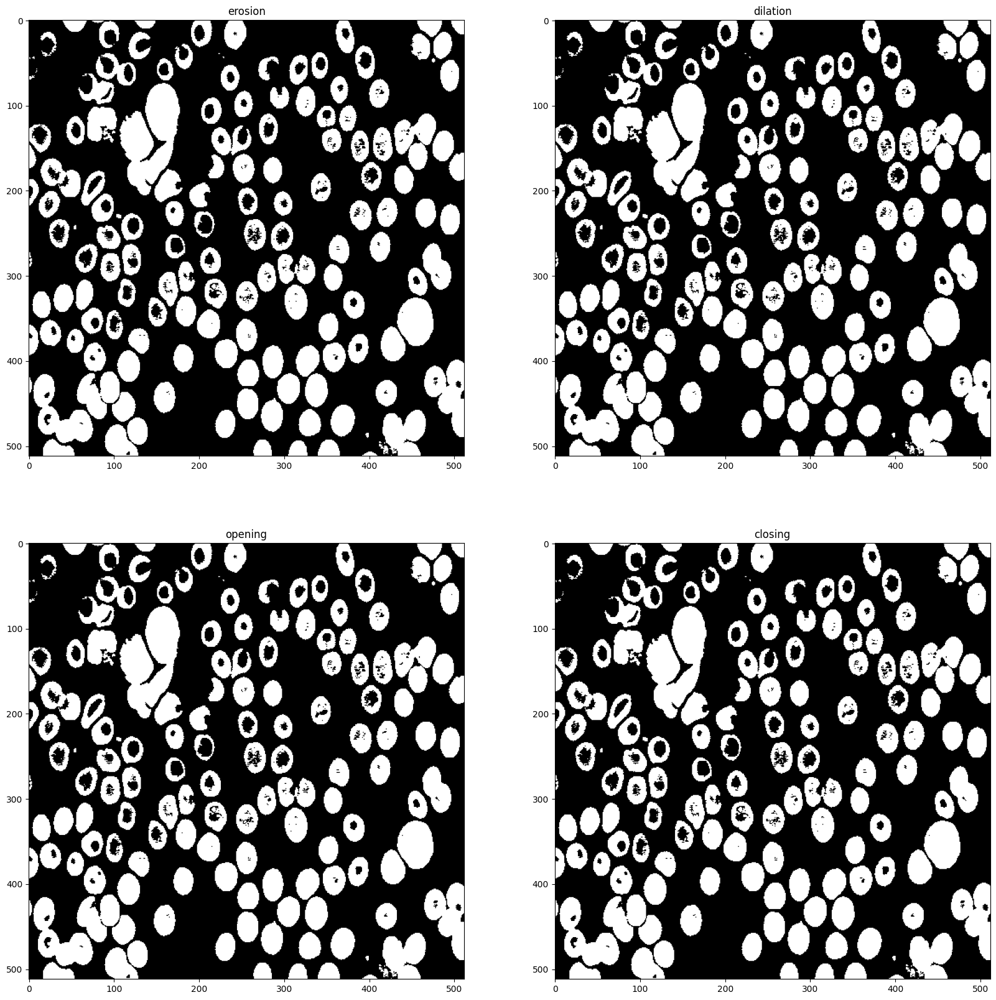

In [142]:
if student :
  strell = line_strell(1)
  plot(strell)

> 4 operations for a structurant element that is a line with length 1.

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : The shape of the structuring element influences the shape of the elements inside the image. Indeed, taking a disk as structuring element will be interesting if we want to dilate or erode circular elements. But in the opposite, it would round up the rectangular elements. Taking a rectangle as structuring element will do exactly the opposite.
- **Q** : What is the influence of the size of the structuring element ?
- **A** : The greater the size is the more important the changes are on the image. Indeed, for the dilation, a great size implies a blend of the elements as for the erosion, a great size implies the disappearance of some cells.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


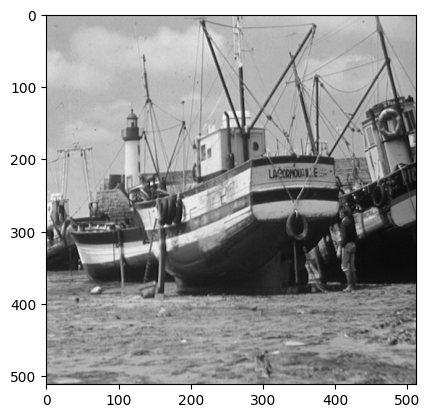

In [143]:
#load the bateau image in grayscale and display it
if student:
  img = skio.imread("bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

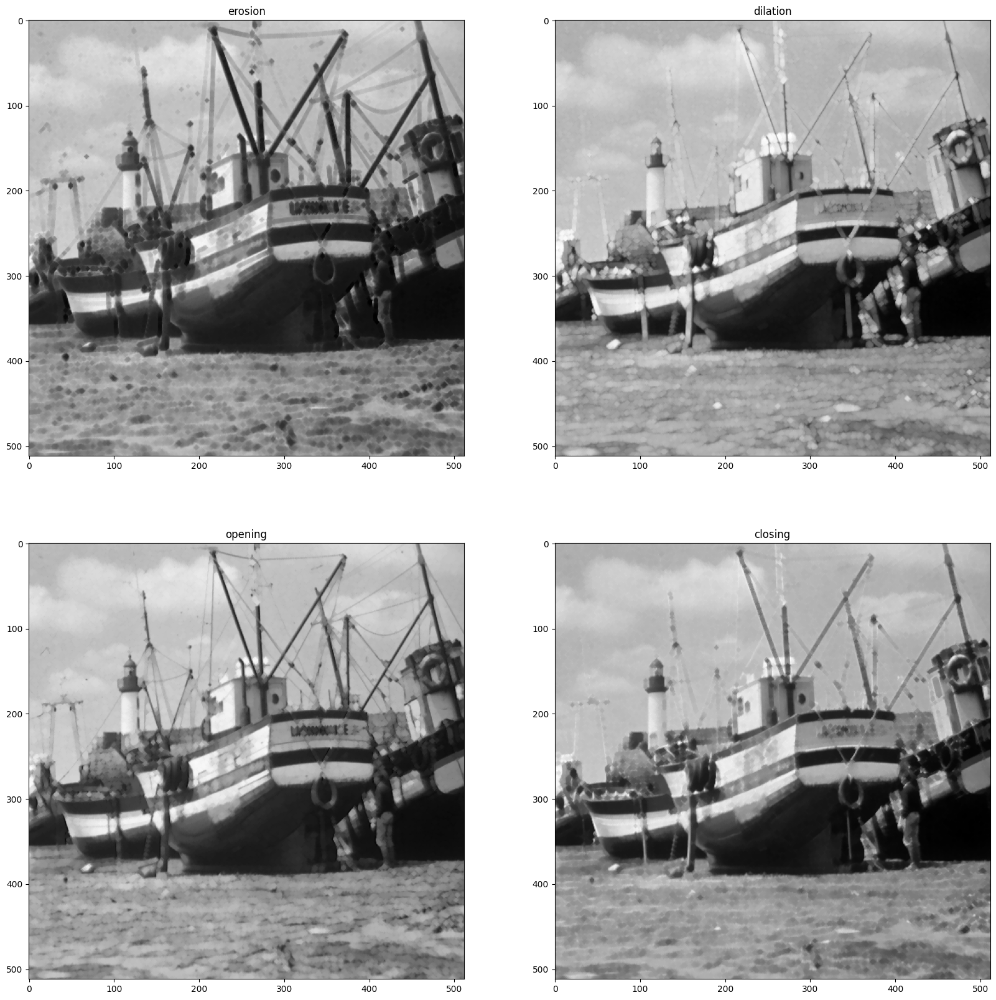

In [144]:
if student:
  strell = morpho.disk(2)
  plot(strell)

>4 operations for a structurant element that is a disk with radius 2.

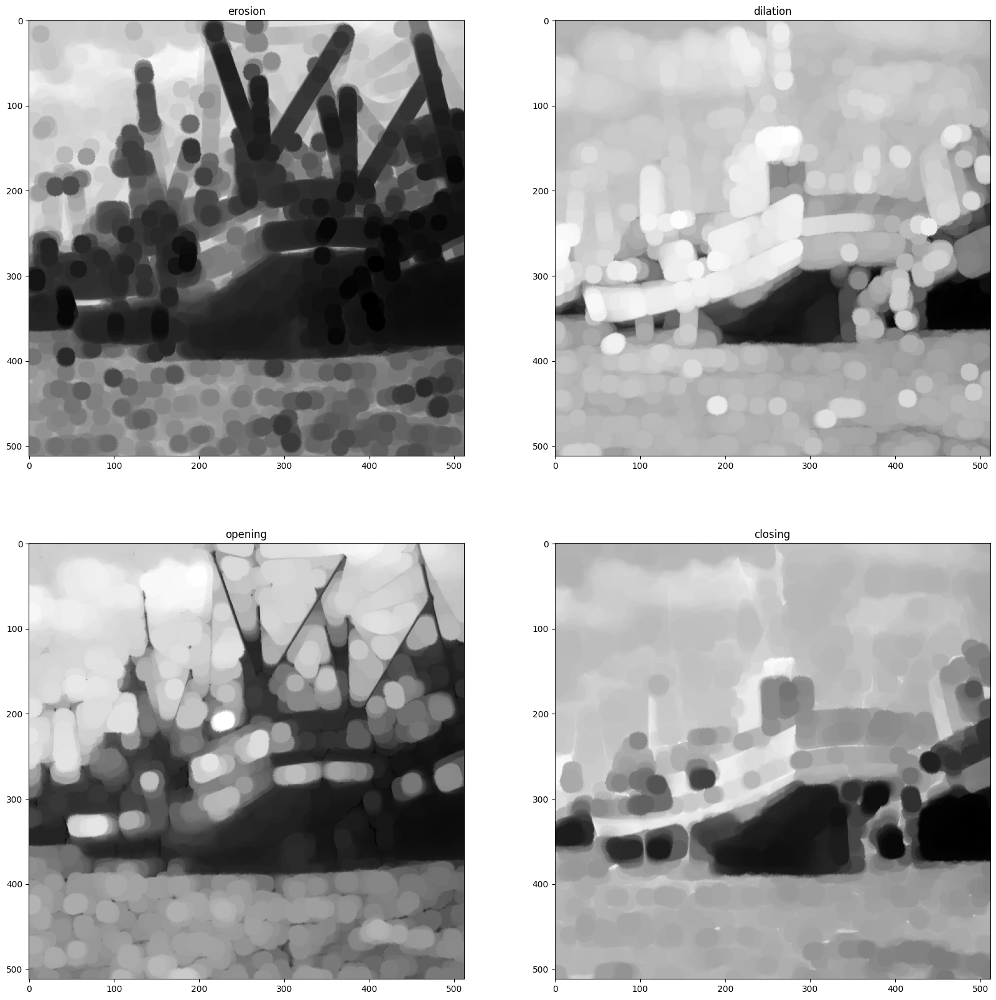

In [145]:
if student:
  strell = morpho.disk(10)
  plot(strell)


>4 operations for a structurant element that is a disk with radius 10.

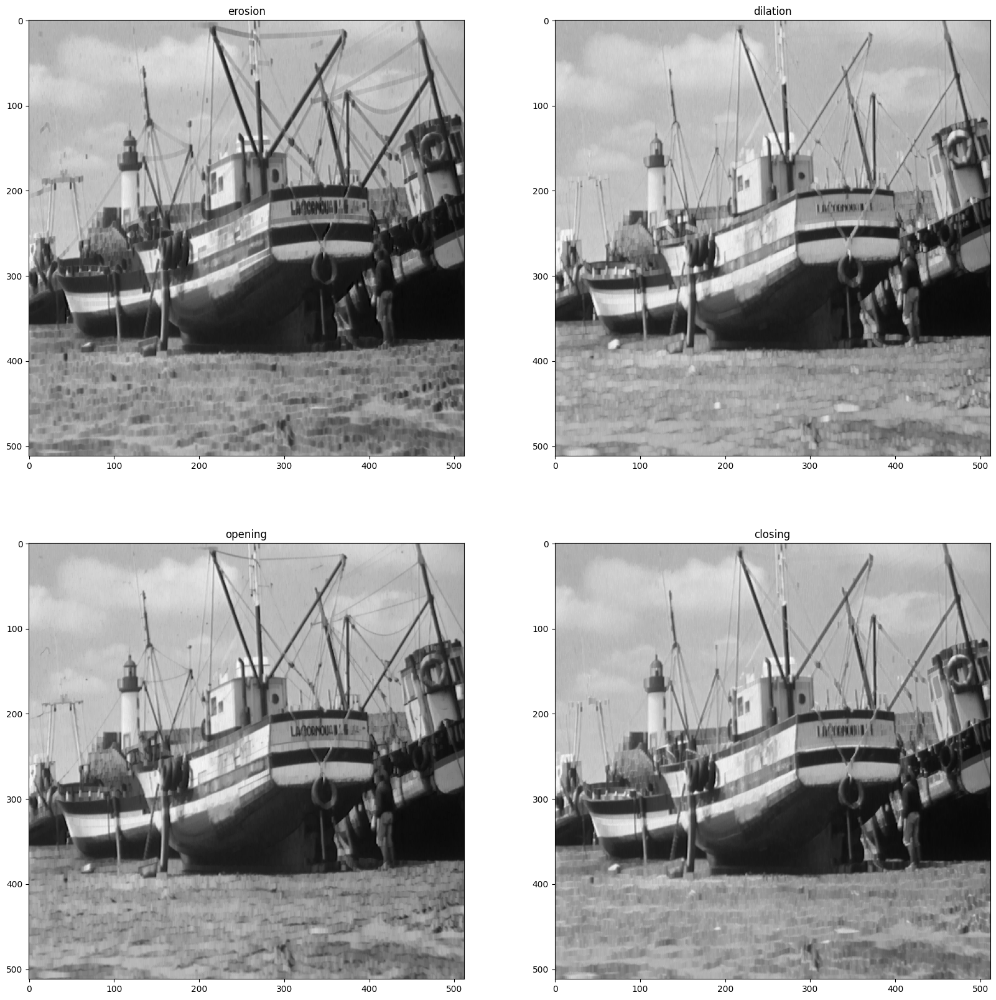

In [146]:
if student:
  strell = line_strell(5)
  plot(strell)

>4 operations for a structurant element that is a rectangle with length 5.

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : The shape has an influence on the shape of the new elements of the image after dilation or erosion, as explained before. The size parameters have effects on the size of those elements, and so the image seems blurry with a great size.

----
- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.

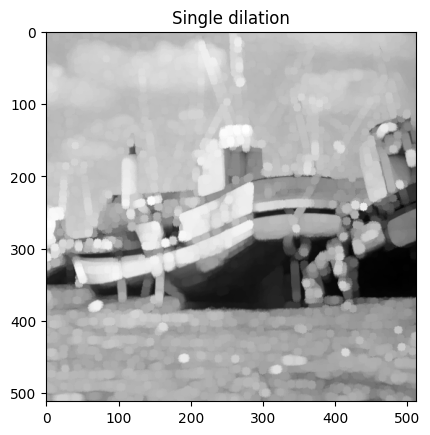

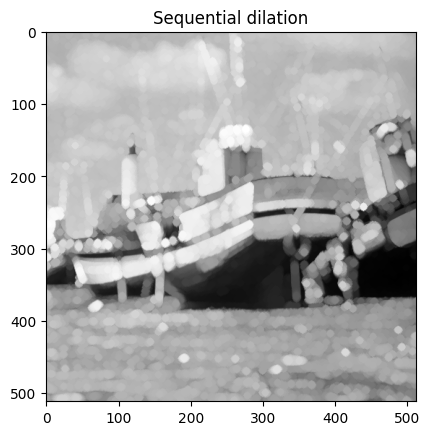

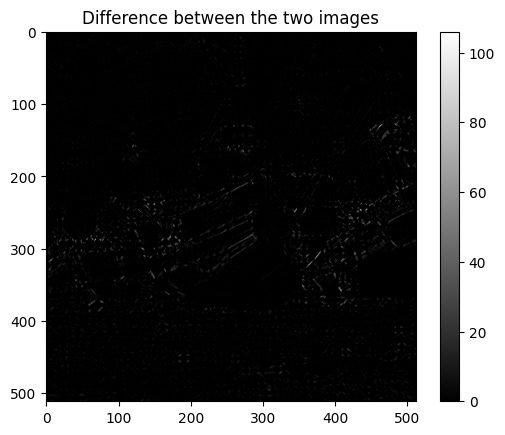

195761


In [147]:
if student:
  ### start code
  dilation = morpho.dilation(img, morpho.disk(5))
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  sequential_dilation = morpho.dilation(morpho.dilation(img, morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **A** : The results of the single dilation and the sequential dilation are similar but not perfectly equivalent. It should be the exact same if the disks were perfect disks.
----

- **Q:** Plot the result of an dilation by a disk structuring element of size 2 followed by
an opening by a disk structuring element of size 3?
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.

[[0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 1 1 1 1 1 0 0 0 0]
 [0 0 0 1 1 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 1 1 1 1 0 0]
 [0 0 1 1 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 1 1 0 0]
 [0 0 1 1 1 1 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 1 1 0 0 0]
 [0 0 0 0 1 1 1 1 1 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]]


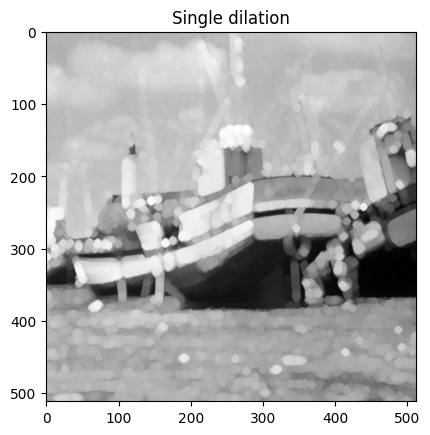

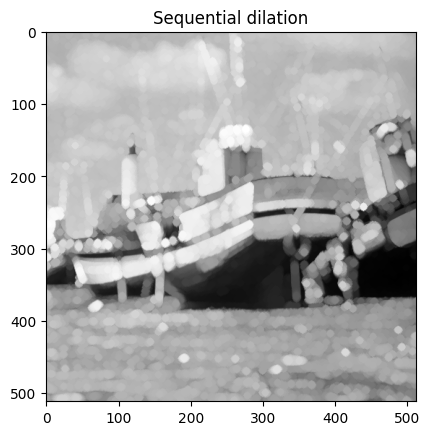

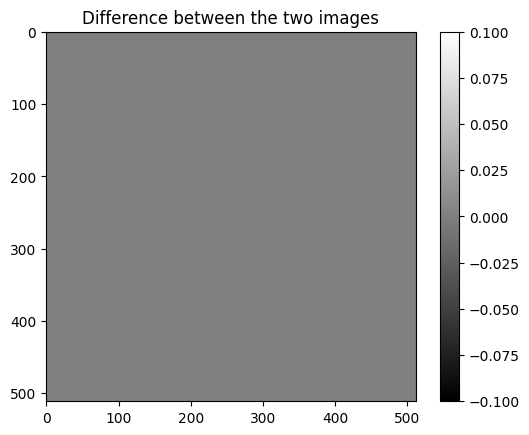

0


In [148]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
  sqr_strell = morpho.disk(2)
  sqr_strell = np.pad(sqr_strell, 4)
  #we add zeros to dilate and have enough space to get a disk and not a rectangle
  sqr_strell = morpho.dilation(sqr_strell, morpho.disk(3))
  print(sqr_strell)

  # Use it to perform the image dilation
  dilation = morpho.dilation(img, sqr_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  # Compare it with the sequential dilation
  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **A:** There is no difference between the two images, so those methods are equivalent. It is logical because the dilated disk is the disk with radius 5.
----

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


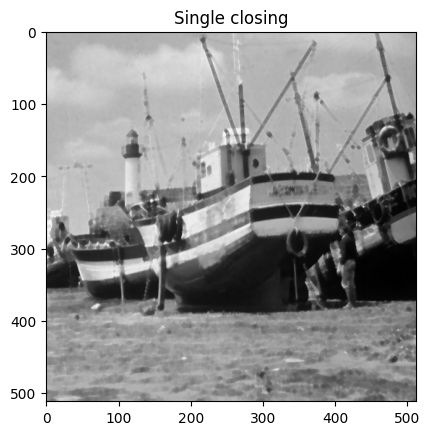

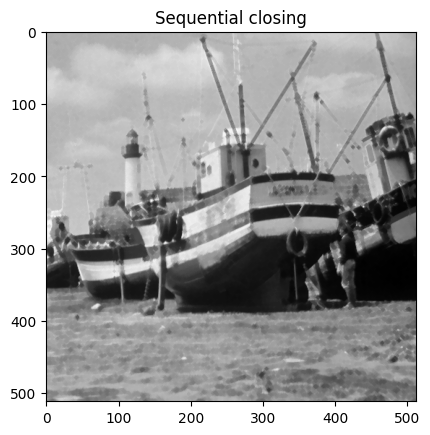

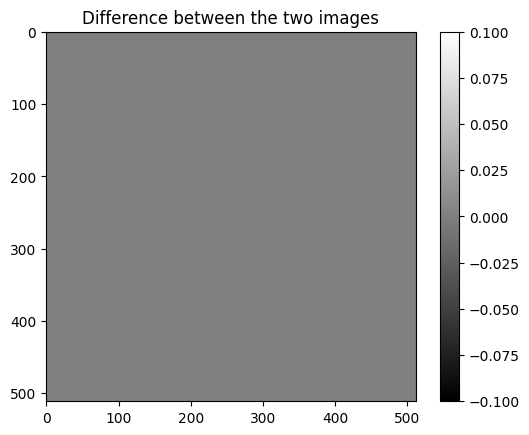

0


In [149]:
if student :
  closing1 = morpho.closing(img, morpho.disk(2))
  plt.imshow(closing1,cmap = "gray")
  plt.title("Single closing")
  plt.show()

  # Compare it with the sequential closing
  closing2 = morpho.closing(closing1, morpho.disk(2))
  plt.imshow(closing2,cmap = "gray")
  plt.title("Sequential closing")
  plt.show()

  plt.imshow(closing1-closing2,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.

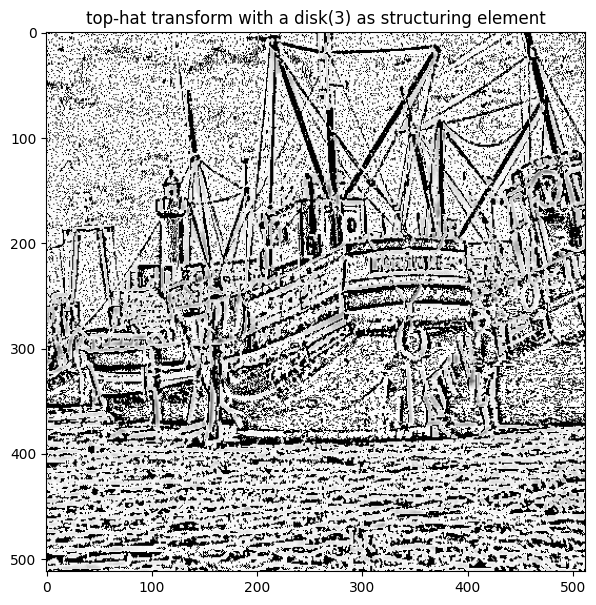

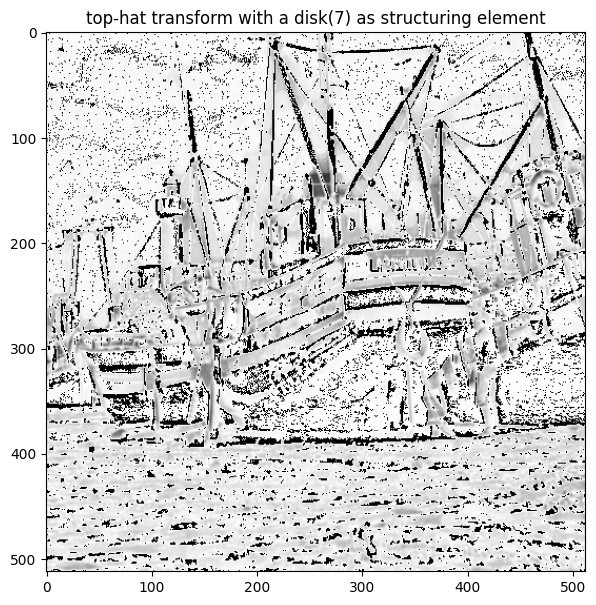

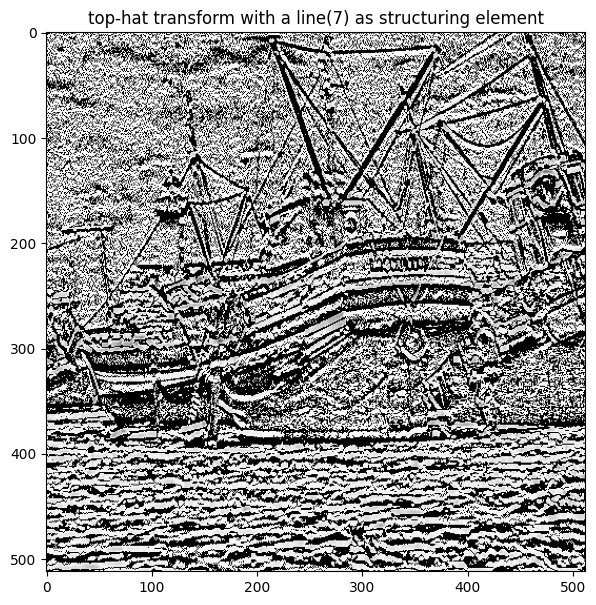

In [150]:
if student:
  strell = morpho.disk(3)
  top_hat = morpho.opening(img, strell) - img
  plt.figure(figsize = (7,7))
  plt.imshow(top_hat,cmap = "gray")
  plt.title('top-hat transform with a disk(3) as structuring element')
  plt.show()
  strell = morpho.disk(7)
  top_hat = morpho.opening(img, strell) - img
  plt.figure(figsize = (7,7))
  plt.imshow(top_hat,cmap = "gray")
  plt.title('top-hat transform with a disk(7) as structuring element')
  plt.show()
  strell = line_strell(7)
  top_hat = morpho.opening(img, strell) - img
  plt.figure(figsize = (7,7))
  plt.imshow(top_hat,cmap = "gray")
  plt.title('top-hat transform with a line(7) as structuring element')
  plt.show()


- **A** :
 The top-hat transform enhances the presence of small structures or details in an image. The size and shape of the structuring element determine which structures or features in the image will be enhanced or extracted. A larger structuring element will capture larger structures, while a smaller one will focus on smaller details. Moreover, a line enhances linear features on the image as the disk enhances circular one.
----

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.

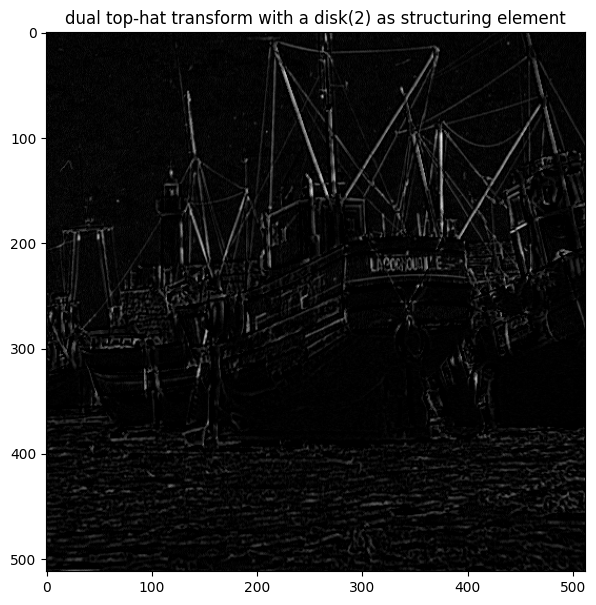

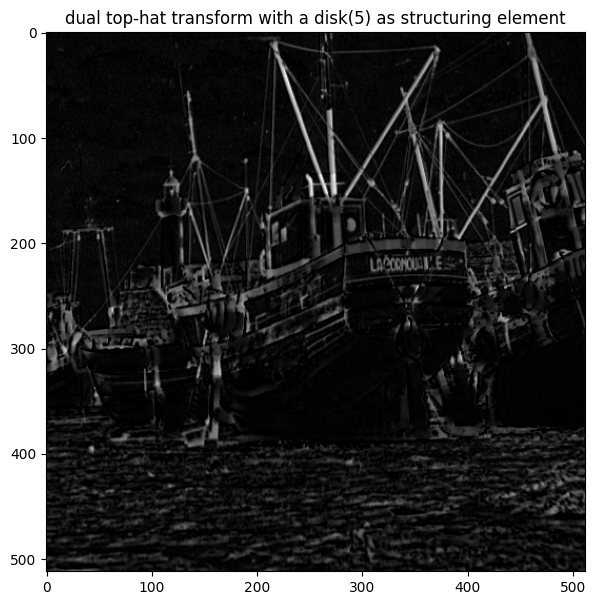

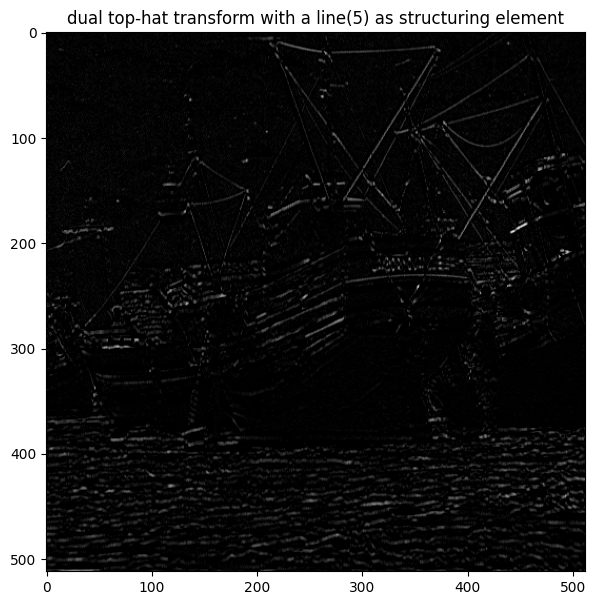

In [151]:
if student:
  strell = morpho.disk(2)
  dual_top_hat = morpho.closing(img, strell) - img
  plt.figure(figsize = (7,7))
  plt.imshow(dual_top_hat,cmap = "gray")
  plt.title('dual top-hat transform with a disk(2) as structuring element')
  plt.show()
  strell = morpho.disk(5)
  dual_top_hat = morpho.closing(img, strell) - img
  plt.figure(figsize = (7,7))
  plt.imshow(dual_top_hat,cmap = "gray")
  plt.title('dual top-hat transform with a disk(5) as structuring element')
  plt.show()
  strell = line_strell(5)
  dual_top_hat = morpho.closing(img, strell) - img
  plt.figure(figsize = (7,7))
  plt.imshow(dual_top_hat,cmap = "gray")
  plt.title('dual top-hat transform with a line(5) as structuring element')
  plt.show()

- **A** : As opposed to the top-hat transform, the dual top-hat transform highlights the regions bigger than the structuring element. The size and shape of the structuring element determine which structures or features in the image will be enhanced. The structures enhanced are those bigger than the structuring element.
----

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?

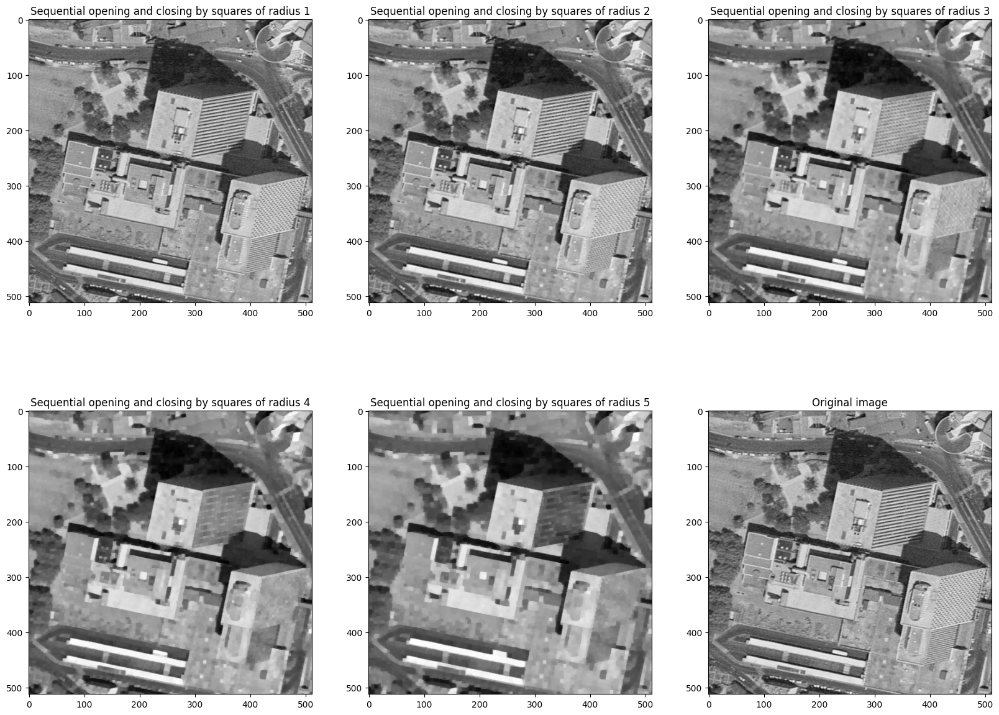

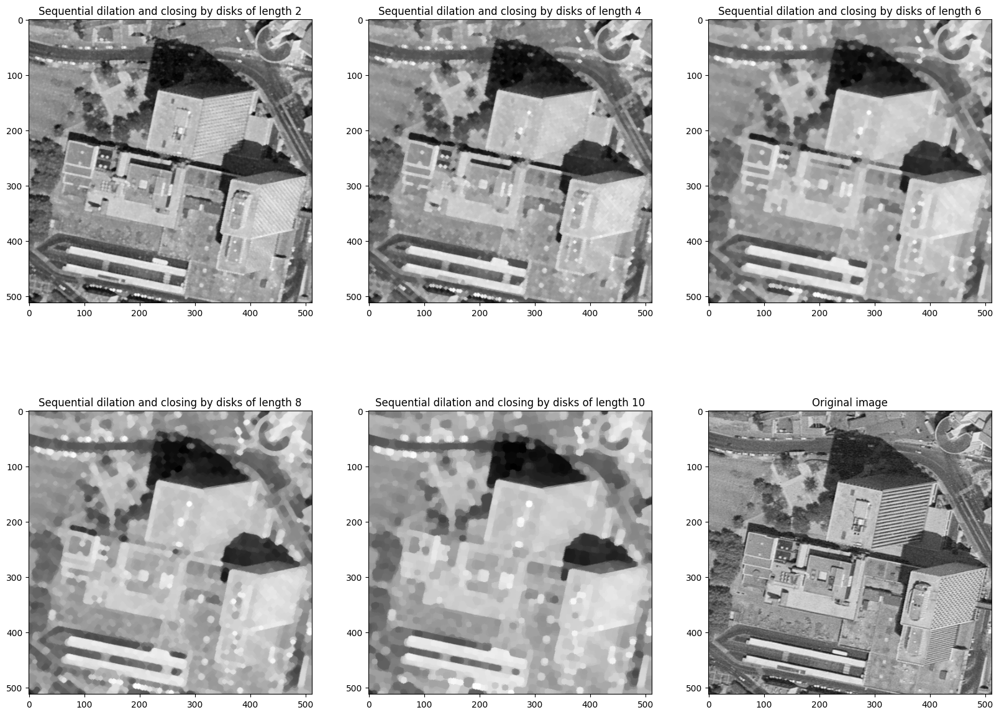

In [152]:
# Example
img = skio.imread("montreuil.tif")

# Structuring elements
se1=morpho.square(1)
se2=morpho.square(2)
se3=morpho.square(3)
se4=morpho.square(4)
se5=morpho.square(5)

# Images
fas1=morpho.closing(morpho.opening(img, se1),se1)
fas2=morpho.closing(morpho.opening(img, se2),se2)
fas3=morpho.closing(morpho.opening(img, se3),se3)
fas4=morpho.closing(morpho.opening(img, se4),se4)
fas5=morpho.closing(morpho.opening(img, se5),se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0, 0].set_title("Sequential opening and closing by squares of radius 1")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0, 1].set_title("Sequential opening and closing by squares of radius 2")
ax[0,2].imshow(fas3,cmap = "gray")
ax[0, 2].set_title("Sequential opening and closing by squares of radius 3")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1, 0].set_title("Sequential opening and closing by squares of radius 4")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1, 1].set_title("Sequential opening and closing by squares of radius 5")
ax[1,2].imshow(img,cmap = "gray")
ax[1, 2].set_title("Original image")
plt.show()

#Try you own
if student :
  se1=morpho.disk(1)
  se2=morpho.disk(2)
  se3=morpho.disk(3)
  se4=morpho.disk(4)
  se5=morpho.disk(5)

  fas1=morpho.closing(morpho.dilation(img, se1), se1)
  fas2=morpho.closing(morpho.dilation(img, se2), se2)
  fas3=morpho.closing(morpho.dilation(img, se3), se3)
  fas4=morpho.closing(morpho.dilation(img, se4), se4)
  fas5=morpho.closing(morpho.dilation(img, se5), se5)

  fig,ax = plt.subplots(2,3,figsize = (20,15))
  ax[0,0].imshow(fas1,cmap = "gray")
  ax[0, 0].set_title("Sequential dilation and closing by disks of length 2")
  ax[0,1].imshow(fas2,cmap = "gray")
  ax[0, 1].set_title("Sequential dilation and closing by disks of length 4")
  ax[0,2].imshow(fas3,cmap = "gray")
  ax[0, 2].set_title("Sequential dilation and closing by disks of length 6")
  ax[1,0].imshow(fas4,cmap = "gray")
  ax[1, 0].set_title("Sequential dilation and closing by disks of length 8")
  ax[1,1].imshow(fas5,cmap = "gray")
  ax[1, 1].set_title("Sequential dilation and closing by disks of length 10")
  ax[1,2].imshow(img,cmap = "gray")
  ax[1, 2].set_title("Original image")
  plt.show()


- **A**: The alternative filters built can be useful for noise reduction with small structuring elements. We can see that the more the radius is the blurry the image is. We can expect then a gaussian filter.
----

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

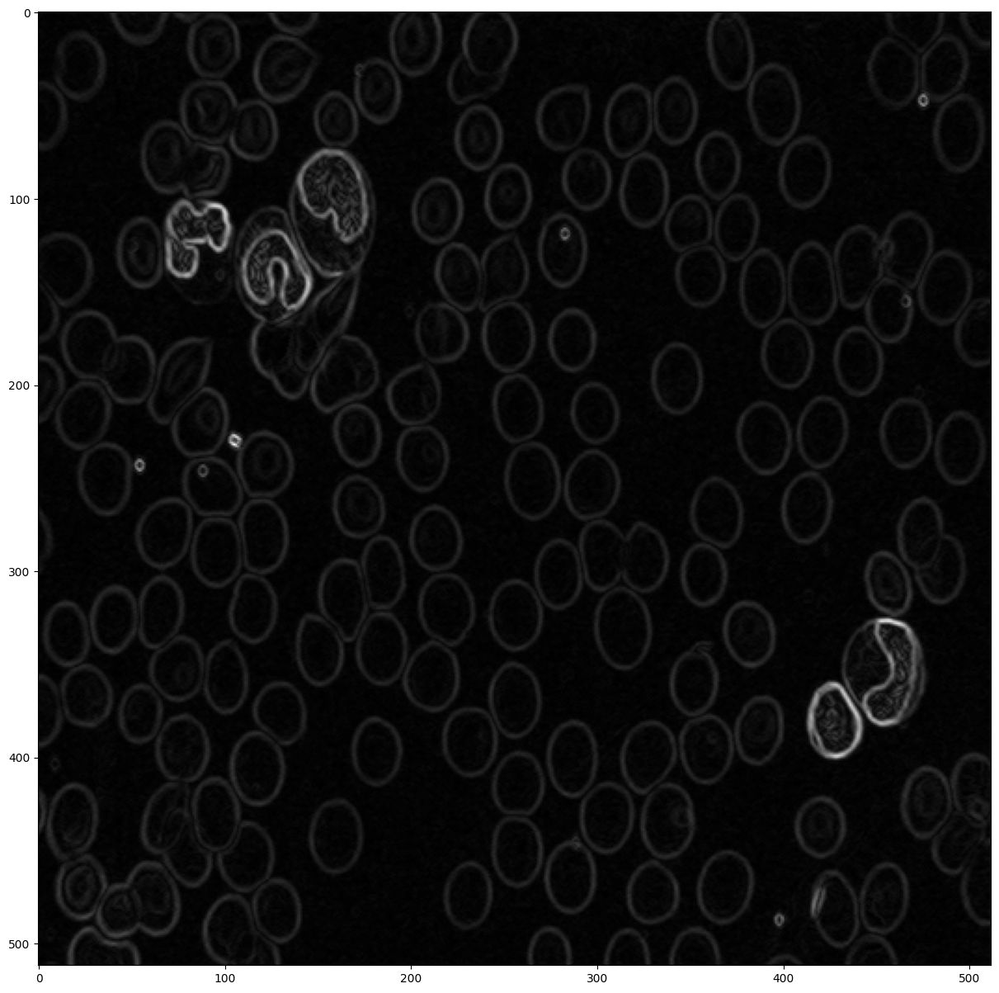

In [153]:
if student :
  img = skio.imread("cell.tif")
  morpho_grad = morpho.dilation(img, morpho.disk(1)) - morpho.erosion(img, morpho.disk(1))
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()



- **A**: We can observe the detection of the edges of the cells, and the information of their thickness.
----

- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?

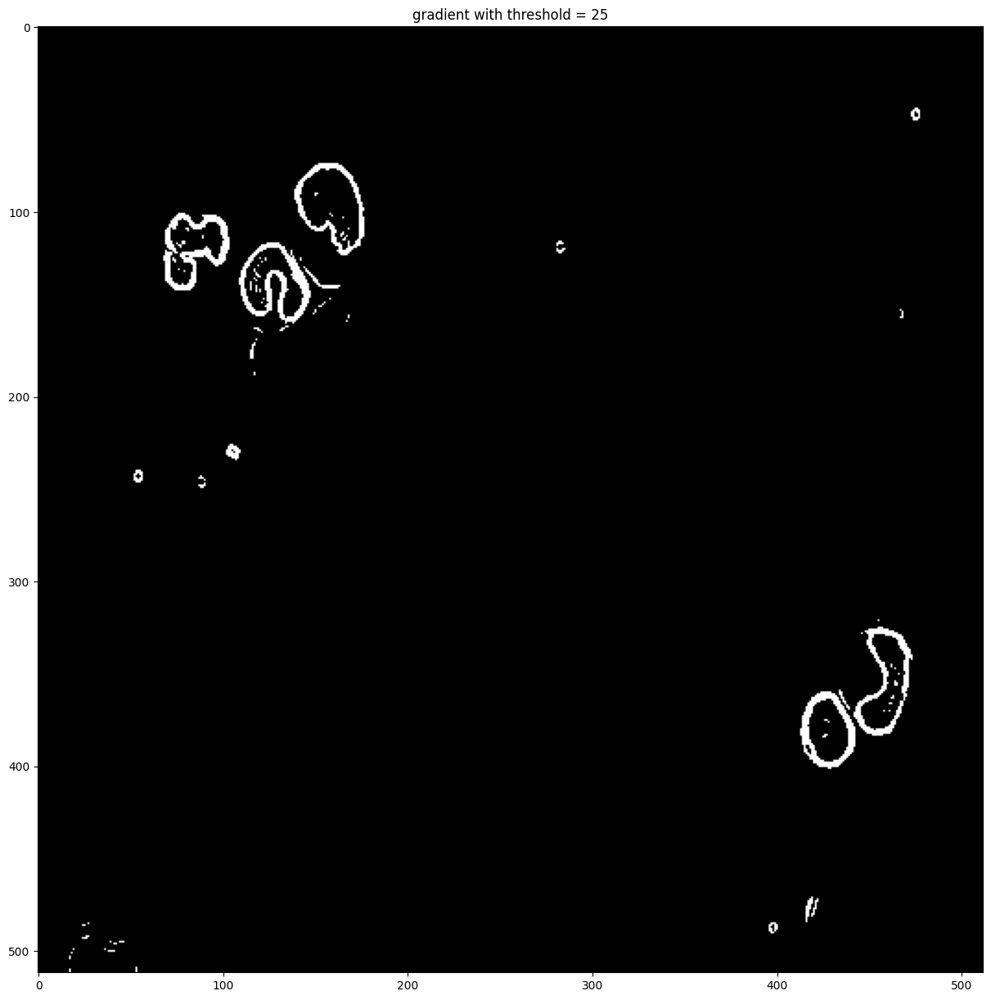

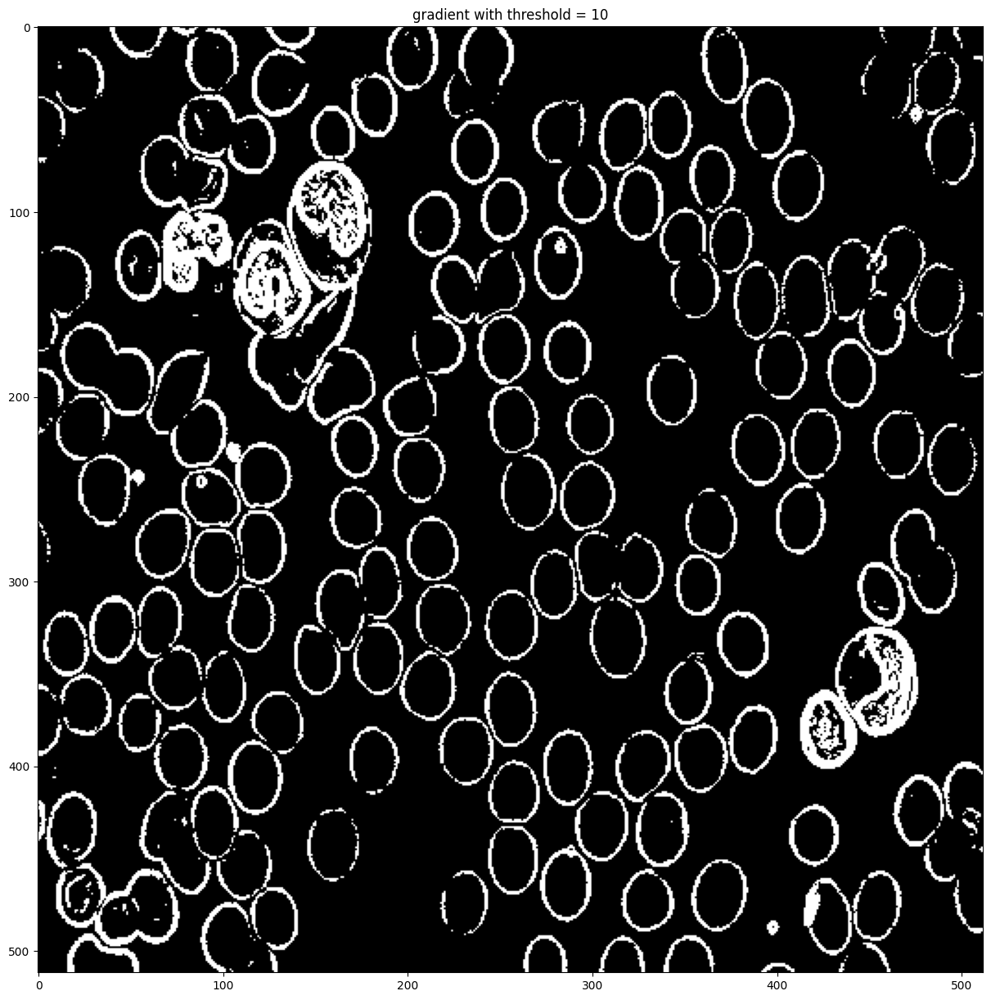

In [154]:
if student :
  thresh_grad = morpho_grad > 25
  plt.figure(figsize=(15,15))
  plt.imshow(thresh_grad,cmap  ="gray")
  plt.title('gradient with threshold = 25')
  plt.show()
  thresh_grad = morpho_grad > 10
  plt.figure(figsize=(15,15))
  plt.imshow(thresh_grad,cmap  ="gray")
  plt.title('gradient with threshold = 10')
  plt.show()



- **A** : The threshold value is difficult to find because if it is to high (ex : 25) we lose some information on most of the cell edges, but if it is too low (ex : 10) we have all the information on the edges but there is also noise.
----

- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ? Try to change the parameter k ; what is the role of that parameter ?

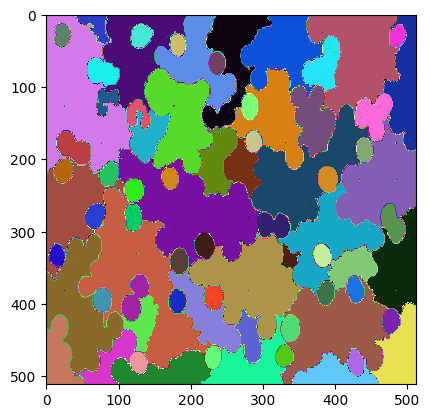

In [155]:
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  wat = seg.watershed(morpho_grad, 100)

plt.imshow(wat, cmap =cmaprand)
plt.show()

- **A** : We observe a segmentation of the image by regions of same grey level. Some regions are corresponding to the cells. The parameter k represents the number of regions of the segmentation.

----

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?

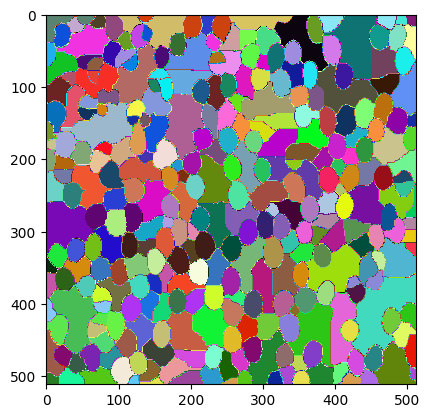

In [156]:
if student :
  wat_closing = seg.watershed(morpho.closing(morpho_grad, morpho.disk(5)))
plt.imshow(wat_closing,cmap =cmaprand)
plt.show()

- **A** : The result is better as most cells are segmented. Though the background regions are now small and can be confused with cells.
----
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous?

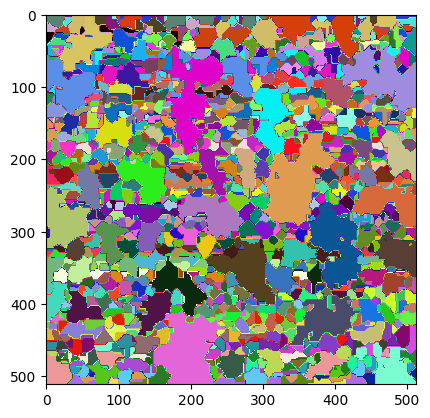

In [157]:
if student :
  wat_opening = seg.watershed(morpho.opening(morpho_grad, morpho.disk(5)))
plt.imshow(wat_opening,cmap =cmaprand)
plt.show()

- **A** : The result is way less convincing, the cell regions are divided into smaller regions which makes it impossible to distinguish.
----

Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

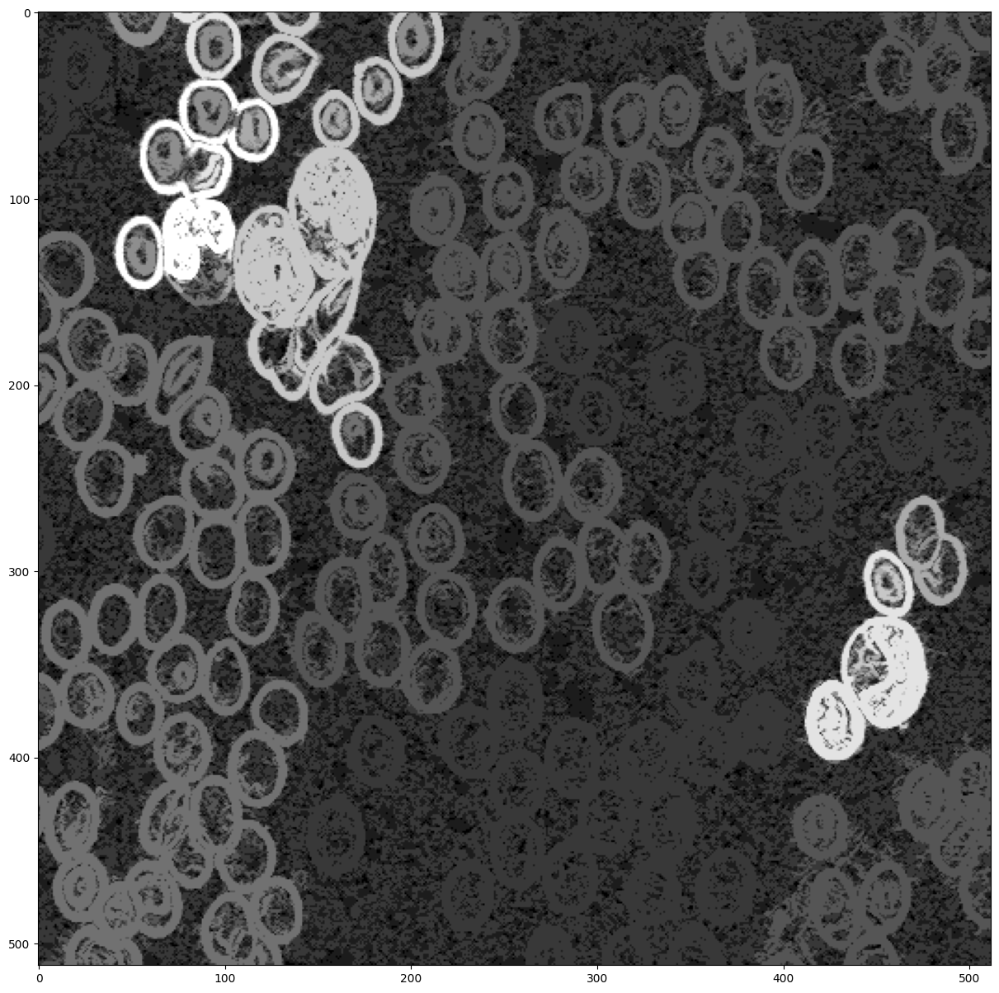

In [158]:
imOpen = morpho.opening(morpho_grad, morpho.disk(5))
reco = morpho.reconstruction(imOpen, morpho_grad)
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()


**A** : We observe a lot of noise and that the edges are thicker than in the original image. It will then be difficult with this reconstruction to efficiently segment the cells.

----

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

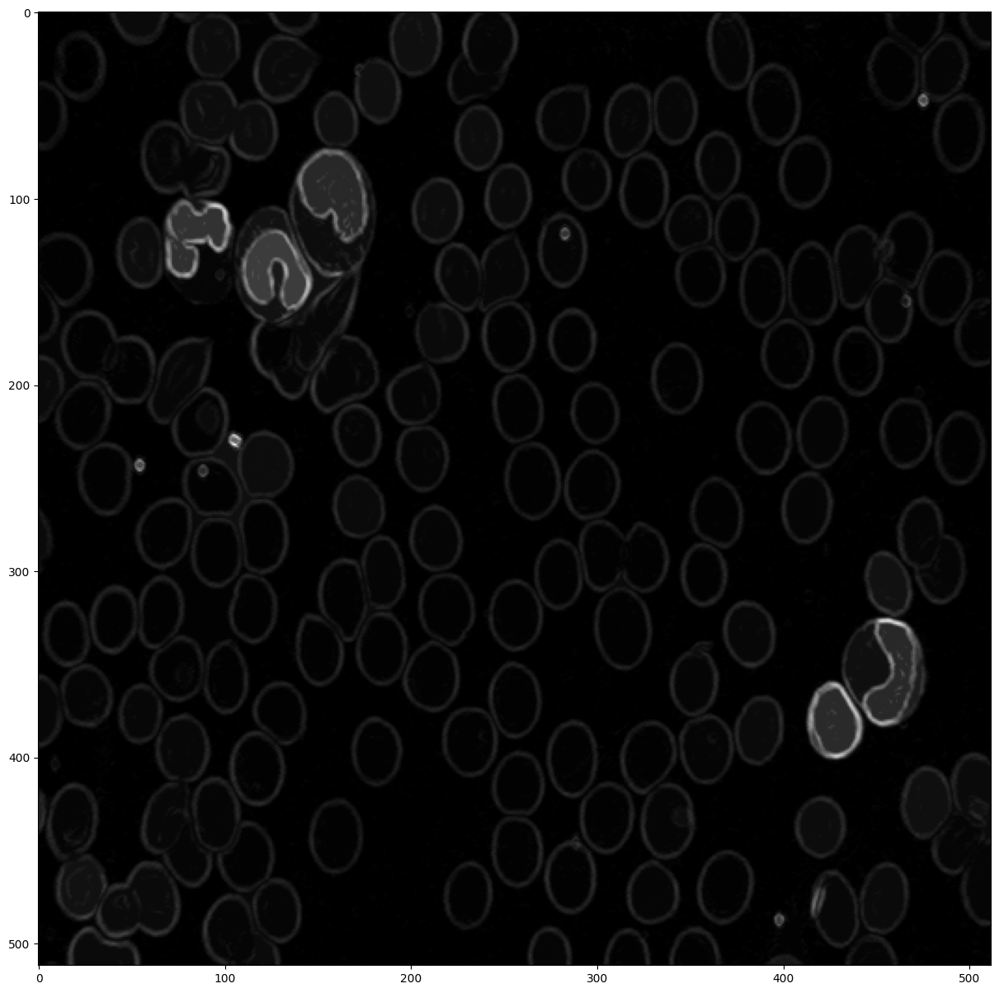

In [159]:
imClos = morpho.closing(morpho_grad, morpho.disk(5))
reco = morpho.reconstruction(imClos, morpho_grad, method='erosion')
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()


**A** : We observe here all cells with the right thickness. This reconstruction will be more efficient for the segmentation as the edges are continuous.

----

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature



<ipython-input-160-cc0cca627b52>:5: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  peaks = peak_local_max(gray_image, min_distance=11, indices=False)


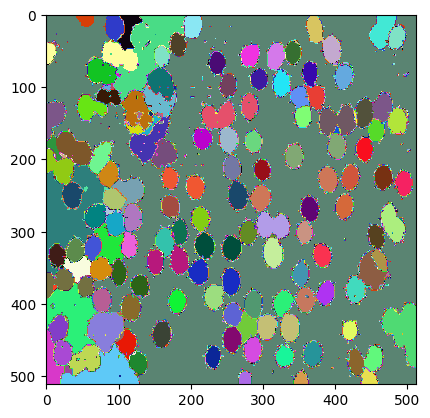

In [160]:
from skimage.feature import peak_local_max
morpho_grad = morpho.dilation(reco, morpho.disk(1)) - morpho.erosion(reco, morpho.disk(1))
tresh_reco = morpho_grad>3
gray_image = (tresh_reco * 255).astype(np.uint8)
peaks = peak_local_max(gray_image, min_distance=11, indices=False)
marker = morpho.label(peaks)
wat = seg.watershed(tresh_reco, marker)

plt.imshow(wat, cmap=cmaprand)